# Akcje
- wypłaszczyć dane, uogólnić 'test_setup_exception', 'test_exception', 'test_teardown_exception' do jednego pola, i po tym polu filtrować/podsumowywać

In [5]:
import pandas as pd
import requests
import json
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from pandas import json_normalize
import ipywidgets as widgets
import re
from ipywidgets import interact, interact_manual

In [6]:
from IPython.display import display, HTML
pd.set_option('display.max_columns', None)  # or 1000
pd.set_option('display.max_rows', None)  # or 1000
pd.set_option('display.max_colwidth', None)  # or 199

In [24]:
# url = 'http://rep-portal.wroclaw.nsn-rdnet.net/api/automatic-test/runs/report/powerbi.1646230408210.json?limit=5000&builds__name__pos_neg=SBTS00%2CSBTS22R1%2CSBTS22R2&ordering=-start&qc_test_instance__test_set__name__pos_neg=2175-RB%2C%202175-QB%2C%201085-A%2C%201085-B%2C%201085-C%2C%207883%2C%202640_AD_DRX_MG%2C%205GC002640_B_Multi_UE_support&qc_test_instance__test_object__pos_neg=Regression&test_case__name__name__pos_neg=2175-RB%2C%202175-QB%2C%201085%2C%207883%2C%202640&fields=no,qc_test_set,test_case__name,hyperlink_set__test_logs_url,test_col__name,start,result,test_line,test_col__testline_type,builds,test_col__ute_version,qc_test_instance__organization,qc_test_instance__test_object,qc_test_instance__feature,test_setup_exception,test_setup_exception_message,test_exception,test_exception_message,test_teardown_exception,test_teardown_exception_message,fail_message&powerBIToken=fbe23d8dc34fb99d08fd12de71b5ab0c6fd90afb'
url = 'http://rep-portal.wroclaw.nsn-rdnet.net/api/automatic-test/runs/report/powerbi.1646299165157.json?limit=3000&builds__name__pos_neg=SBTS00%2CSBTS22R1%2CSBTS22R2&ordering=-start&qc_test_instance__test_set__name__pos_neg=2175-RB%2C%202175-QB%2C%201085-A%2C%201085-B%2C%201085-C%2C%207883%2C%202640_AD_DRX_MG%2C%205GC002640_B_Multi_UE_support&qc_test_instance__test_object__pos_neg=Regression&test_case__name__name__pos_neg=2175-RB%2C%202175-QB%2C%201085%2C%207883%2C%202640&result__name__pos_neg=not%20analyzed%2C%20env&fields=no,qc_test_set,test_case__name,hyperlink_set__test_logs_url,test_col__name,start,result,test_line,test_col__testline_type,builds,test_col__ute_version,qc_test_instance__organization,qc_test_instance__test_object,qc_test_instance__feature,test_setup_exception,test_setup_exception_message,test_exception,test_exception_message,test_teardown_exception,test_teardown_exception_message,fail_message&powerBIToken=fbe23d8dc34fb99d08fd12de71b5ab0c6fd90afb'
df = get_normalized_json_from_url(url)

In [20]:
with open("data.json") as json_file:
    records = json.load(json_file)['results']
    df = json_normalize(records)

## Helper functions

In [37]:
exception_dict = {
    r'NoRegexpMatch:.*after 10 secs to match regexp \(.*\) in output': "EGATE print did not match",
    r'MibSibAcquisitionFailed': "MIB-SIB Acquisition Failed",
    r'RadioHeadTimeoutException': "RadioHeadTimeoutException",
    r'ParsingFailed:.*syslog': "Cannot find print in syslog",
    r'AdminApiProcedureFailureException': "Admin API exception",
    r'Number of messages \d+ is not.*': "Cannot find print in syslog",
    r'It was not possible to find string.*Established PDU session': "PDU session setup failure",
    r'It was not possible to find string.*Received REGISTRATION COMPLETE': "UE register failure",
    r'UnboundLocalError: local variable.*admin_connection.*referenced before assignment': "Admin API exception",
    r'Value for period \d+ is \d+ but expected is': "PM Counter error",
    r'CounterNotFound': "PM Counter error",
    r'MessageObserverTimeout': "PCAP validation failed",
    r'NoRegexpMatch: Fail regexp found \(.*handover.*performed.*\)': "Handover performed while it should not have been",
    r'No keyword with name': "Test script error",
    r'NoValidConnectionsError:.*192.168.255.1': "Connection to gNB was lost",
    r'AdminApi.*Exception': "Admin API exception",
    r'DTX ratio.*is to.*high': "DTX ratio is to high",
    r'.*is present in SCF. This is unexpected': "Object in SCF is present, while it should not be",
    r'.*is present in SCF, while it should not be': "Object in SCF is present, while it should not be",
    r'.*is not present in SCF': "Object is missing from SCF",
    r'.*not found in gNB tcpdump file': "PCAP validation failed",
    r'Counter.*does not satisfy the expression': "PM Counter error",
    r'NoMessageInFlow:.*': "PCAP validation failed",
}

def establishing_exception_type(msg):
        lines = msg.split('\n')
        for line in lines:
            for regexp in exception_dict.keys():
                if re.search(regexp, line):
                    return exception_dict[regexp]
        print(msg)
        return lines[0]

def get_normalized_exception_data(df):
    df_temp = df.copy()
    df_temp['exception_type'] = df_temp.apply(lambda value: establishing_exception_type(value.fail_message), axis=1)
    return df_temp

def plot_runs_by_exception_types(df):
    size = len(df.index)
    df_temp = get_normalized_exception_data(df)
    df_temp.drop(['fail_message'], axis=1, inplace=True)
    df_temp = df_temp.groupby(['exception_type']).count()['result'].reset_index()
    
    df_temp.sort_values(by=["result"], inplace=True, ignore_index=True)
    ax = df_temp.plot.barh(x="exception_type", figsize=(10,8))
    ax.text(10, 3, f"Number of total failed runs {size}")
    ax.legend(bbox_to_anchor=(1, 0.3), fontsize='14');
    for p in ax.patches:
        w = p.get_width()
        ax.annotate(f'{w:.2f}', (w * 0.5, p.get_y() + 0.1))
#     display(df_temp)
    
    
def get_normalized_json_from_url(url):
    response = requests.get(url)
    resp_dict = response.json()
    recs = resp_dict['results']
    df = json_normalize(recs)
    return df

In [34]:
df_failed = df[(df['fail_message'] != '') & (df['fail_message'].notnull())]
# df_failed = df[df['fail_message'].notnull()]
display(df_failed)
# df_na.groupby(['test_exception']).count()
# df_na.groupby([df_na.index, 'test_exception']).count()['result']
# df_temp = df.groupby(['fail_message']).count()['result'].reset_index()
# df_temp2 = df.groupby(['test_setup_exception', 'test_exception', 'test_teardown_exception']).count()['result'].reset_index()

# df_sample = df_na.iloc[:3]


# display(df_temp2)
# df_temp.plot.barh(x="fail_message")

,result,test_line,builds,qc_test_set,start,fail_message,test_setup_exception,test_setup_exception_message,test_exception,test_exception_message,test_teardown_exception,test_teardown_exception_message,test_col.ute_version,test_col.name,test_col.testline_type,test_case.name,qc_test_instance.test_object,qc_test_instance.organization,qc_test_instance.feature,hyperlink_set.log_file_url,hyperlink_set.test_logs_url,hyperlink_set
0,not analyzed,MN Trunk Engine_Wroclaw_UTE5GCLASSICAL1725,SBTS00_ENB_9999_220302_000006,5GC001085-B_Intra-frequency_inter-gNB_neighbor_NRREL_addition_-_Previously_established_Xn,2022-03-02T23:02:43.057000,"NoRegexpMatch: It was not possible to find string after 10 secs to match regexp (NgAP Link with GUAMI .* not found) in output\n(\nEGATE> 00:10:02.916 TRC: UEC-1: UE1[NR-RRC]: <-UL-DCCH-NR\nvalue UL-DCCH-Message ::= \n{\n message c1 : measurementReport : \n {\n criticalExtensions measurementReport : \n {\n measResults \n {\n measId 1,\n measResultServingMOList \n {\n {\n servCellId 0,\n measResultServingCell \n {\n physCellId 50,\n [ Message content over the limit has been removed. ]\n\n }\n\n }\n\n }\n\n }\n\n }\n\n }\n\n }\n\n}\n\n\n\nEGATE> )",,,NoRegexpMatch,It was not possible to find string after 10 secs to match regexp (NgAP Link with GUAMI .* not found) }\n\n }\n\n }\n\n }\n\n }\n\n }\n\n }\n\n }\n\n}\n\n\n\nEGATE> ),,,2209.08.00\n,5GC001085-B,CLOUD_5G_I_LO_AP_LO_SANSA_FS_ECPRI_CMWV_TDD,5GC001085_B_017_Unsupported_PLMN_received_in_cgi-info,Regression,RAN_L2_SW_KRK_2_SG02,5GC001085-B,http://logs.ute.nsn-rdnet.net/cloud/execution/13616131/execution_for_preparation_d7dd1529-ed16-44a8-ba79-90fb44264fb7/test_results/log.html,http://logs.ute.nsn-rdnet.net/cloud/execution/13616131/,NaN
1,not analyzed,MN Trunk Engine_Wroclaw_UTE5GCLASSICAL2424,SBTS22R1_ENB_0000_001407_000052,5GC001085-B_Intra-frequency_inter-gNB_neighbor_NRREL_addition_-_Previously_established_Xn,2022-03-02T21:40:00.284000,Parent suite setup failed:\nValueError: No JSON object could be decoded,ValueError,No JSON object could be decoded,,,,,2209.08.00\n,5GC001085-B-CIT,CLOUD_5G_I_LO_AP_LO_SANSA_FS_ECPRI_CMWV_TDD,5GC001085_B_003_Empty_gnbIdLengthConfig_object_-_trigger_ANR,Regression,RAN_L2_SW_KRK_2_SG02,5GC001085-B,http://logs.ute.nsn-rdnet.net/cloud/execution/13622314/execution_for_preparation_5d1b5610-3a38-46d3-8bfa-affb50ee19f0/test_results/log.html,http://logs.ute.nsn-rdnet.net/cloud/execution/13622314/,NaN
2,not analyzed,MN Trunk Engine_Wroclaw_UTE5GCLASSICAL1725,SBTS00_ENB_9999_220302_000006,5GC001085-B_Intra-frequency_inter-gNB_neighbor_NRREL_addition_-_Previously_established_Xn,2022-03-02T20:58:05.111000,ParsingFailed: Cannot find any string to match regexp (with status hoFailed Received NeighbourStatusUpdateInd) in file (/home/ute/test_results/syslog/syslog_gnb_1085_B_008_127.0.0.1.log),,,ParsingFailed,Cannot find any string to match regexp (with status hoFailed Received NeighbourStatusUpdateInd) in file (/home/ute/test_results/syslog/syslog_gnb_1085_B_008_127.0.0.1.log),,,2209.08.00\n,5GC001085-B,CLOUD_5G_I_LO_AP_LO_SANSA_FS_ECPRI_CMWV_TDD,5GC001085_B_008_Both_NCI_Range_and_PLMN_ID_in_gnbIdLengthConfig_object_-_no_match_-_trigger_ANR,Regression,RAN_L2_SW_KRK_2_SG02,5GC001085-B,http://logs.ute.nsn-rdnet.net/cloud/execution/13616131/execution_for_preparation_d7dd1529-ed16-44a8-ba79-90fb44264fb7/test_results/log.html,http://logs.ute.nsn-rdnet.net/cloud/execution/13616131/,NaN
3,not analyzed,MN Trunk Engine_Wroclaw_UTE5GCLASSICAL1471,SBTS22R1_ENB_0000_001407_000052,5GC001085-B_Intra-frequency_inter-gNB_neighbor_NRREL_addition_-_Previously_established_Xn,2022-03-02T20:57:35.750000,Parent suite setup failed:\nValueError: No JSON object could be decoded,ValueError,No JSON object could be decoded,,,,,2209.08.00\n,5GC001085-B-CIT,CLOUD_5G_I_LO_AP_LO_SANSA_FS_ECPRI_CMWV_TDD,5GC001085_B_003_Empty_gnbIdLengthConfig_object_-_trigger_ANR,Regression,RAN_L2_SW_KRK_2_SG02,5GC001085-B,http://logs.ute.nsn-rdnet.net/cloud/execution/13622172/execution_f

## plot_runs_by_exception_types 

Parent suite setup failed:
ValueError: No JSON object could be decoded
Parent suite setup failed:
ValueError: No JSON object could be decoded
KeyError: 'No match found! Query might be not valid.'
PUCCH format on scells is set(['FOR_SCELL', 'FROM_PUSCH']) instead of FOR_SCELL only
Setup failed:
AttributeError: 'NoneType' object has no attribute 'group'
There are <= 0 (less or equal to 0) NRRELs in SCF
AssertionError
PUCCH format on scells is set(['FOR_SCELL', 'FROM_PUSCH']) instead of FOR_SCELL only
PUCCH format on scells is set(['FOR_SCELL', 'FROM_PUSCH']) instead of FOR_SCELL only
There are <= 0 (less or equal to 0) NRRELs in SCF
There are <= 0 (less or equal to 0) NRRELs in SCF
Test execution stopped due to a fatal error.
Execution terminated by signal
AssertionError
PUCCH format on scells is set(['FOR_SCELL', 'FROM_PUSCH']) instead of FOR_SCELL only
Setup failed:
EmptyResult: Result is not available after 480.0 seconds
AssertionError
Setup failed:
NoHostFound: Scanner is not able to

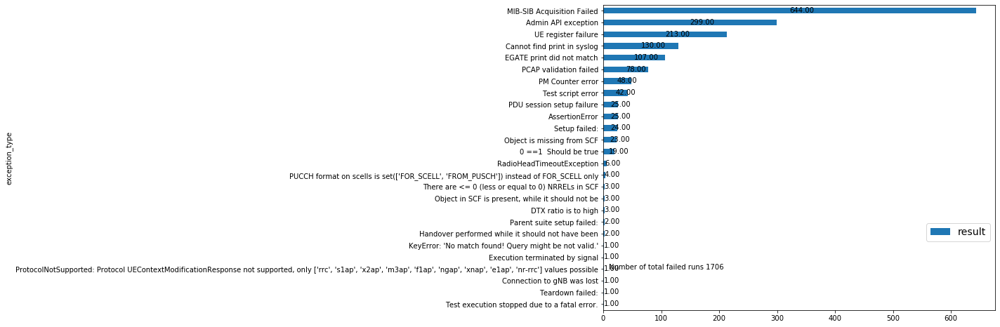

In [38]:
plot_runs_by_exception_types(df_failed)

In [1]:
from data_handler import RepPortal

In [4]:
list_param = 'qc_test_instance,qc_test_set,end'
data = RepPortal().get_data_and_filter({('qc_test_instance', 'organization'):r'RAN_L2',
                                       'qc_test_set':'gNB_neighbor_NRREL_and_Xn_addition_SON_Config_Transfer',
                                       'end':'2022-03-24'}, param_list=list_param, limit=10000)

JSONDecodeError: Expecting value: line 1 column 1 (char 0)

In [3]:
len(data)

NameError: name 'data' is not defined

In [6]:
data

[{'id': 61714756,
  'test_case': {'name': 'CB007883_5G_A_027_Full_ANR_procedure_-_no_NRREL_and_no_NRADJNRCELL_and_no_NRADJGNB_and_no_XNLINK_objects'},
  'qc_test_instance': {'id': 10595995,
   'qc_id': {'url': 'tds://ran_et.mn_ran.qc-prod.ext.net.com/qcbin/TestLabModule-000000003649890581?EntityType=ITestInstance&EntityID=86929',
    'id': 86929},
   'res_tester': 'Flaum Maciej Mieczyslaw (flaum)',
   'regression_status': 'rg_CRT',
   'test_object': 'Regression',
   'organization': 'RAN_L2_SW_KRK_2_SG02',
   'feature': 'CB007883-5G-A',
   'platform': '1.ABIL_L, ASIK_L',
   'location': '',
   'test_entity': 'CRT',
   'hw_id': 'Airphone_sub_6GHZ',
   'm_path': 'Root\\Test_Sets\\Trunk\\RAN_L2_SW_KRK_2\\CB007883-5G_Spillover_of_5GC001085_ANR_for_SA_intra-NR_intra-frequency_UE_based',
   'solution': ''},
  'result': 'not analyzed',
  'builds': 'SBTS00_ENB_9999_220324_000008',
  'configuration': None,
  'qc_test_set': 'CB007883-5G-D_-_Spillover_of_5GC001085-D_Intra_Frequency_Inter-gNB_neighb

In [4]:
data[0].keys()

dict_keys(['id', 'test_case', 'qc_test_instance', 'result', 'builds', 'configuration', 'qc_test_set', 'end', 'fail_message'])

In [5]:
data[0]['id']

61714756

In [7]:
from datetime import datetime
datetime.strptime("2021-11-13T13:06:04.403000", '%Y-%m-%dT%H:%M:%S.%f')

datetime.datetime(2021, 11, 13, 13, 6, 4, 403000)